### 데이터 준비

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-5205a7c1-bd5d-5da6-d586-03b449a85365)


In [ ]:
!pip install --upgrade --no-cache-dir gdown

  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6


In [ ]:
!gdown 1aJwrRilvlYHjlUVaAMT7E66YQQR5LB2A

In [ ]:
!gdown https://drive.google.com/uc?id=13EMmfsyjrEbtisVuPOl1VUuJnjI7-4Ez

Access denied with the following error:

 	Too many users have viewed or downloaded this file recently. Please
	try accessing the file again later. If the file you are trying to
	access is particularly large or is shared with many people, it may
	take up to 24 hours to be able to view or download the file. If you
	still can't access a file after 24 hours, contact your domain
	administrator. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=13EMmfsyjrEbtisVuPOl1VUuJnjI7-4Ez 



In [ ]:
!gdown https://drive.google.com/uc?id=1KbD2iQftuJenERkFNcHBWjJmlxk-_HW3

Downloading...
From (uriginal): https://drive.google.com/uc?id=1KbD2iQftuJenERkFNcHBWjJmlxk-_HW3
From (redirected): https://drive.google.com/uc?id=1KbD2iQftuJenERkFNcHBWjJmlxk-_HW3&confirm=t&uuid=205c661f-3d14-468d-b2be-a04d1c5f5c48
To: /content/open.zip
100% 19.2G/19.2G [04:19<00:00, 73.9MB/s]


In [ ]:
!gdown https://drive.google.com/uc?id=1HMy8IFlOx_uWgBABUEUc5m1TVnRWScjB

Downloading...
From (uriginal): https://drive.google.com/uc?id=1HMy8IFlOx_uWgBABUEUc5m1TVnRWScjB
From (redirected): https://drive.google.com/uc?id=1HMy8IFlOx_uWgBABUEUc5m1TVnRWScjB&confirm=t&uuid=fa9f6721-343a-4a28-a139-613bca686fed
To: /content/open.zip
100% 19.2G/19.2G [02:46<00:00, 115MB/s]


In [ ]:
!unzip -qq "open.zip"

### Import

In [ ]:
import os
import gc
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.ops import sigmoid_focal_loss

from tqdm import tqdm
import albumentations as A
from albumentations.pytorch import ToTensorV2

from google.colab import files

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


### Utils

In [ ]:
# RLE 디코딩 함수
def rle_decode(mask_rle, shape):
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape)

# RLE 인코딩 함수
def rle_encode(mask):
    pixels = mask.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)

### Custom Dataset


In [ ]:
class SatelliteDataset(Dataset):
    def __init__(self, csv_file, transform=None, infer=False):
        self.data = pd.read_csv(csv_file)
        self.transform = transform
        self.infer = infer

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_path = self.data.iloc[idx, 1]
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        if self.infer:
            if self.transform:
                image = self.transform(image=image)['image']
            return image

        mask_rle = self.data.iloc[idx, 2]
        mask = rle_decode(mask_rle, (image.shape[0], image.shape[1]))

        if self.transform:
            augmented = self.transform(image=image, mask=mask)
            image = augmented['image']
            mask = augmented['mask']

        return image, mask

### Define Model

In [ ]:
class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ResBlock, self).__init__()
        self.res_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )

        self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1)

    def forward(self, x):
        r = self.res_conv(x)
        s = self.shortcut(x)
        return r + s

In [ ]:
class UpConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UpConv, self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear'),
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
        )

    def forward(self, x):
        x = self.up(x)
        return x

In [ ]:
class AttentionBlock(nn.Module):
    def __init__(self, in_channels, middle_channels):
        super(AttentionBlock, self).__init__()
        self.w_g = nn.Sequential(
            nn.Conv2d(in_channels, middle_channels, kernel_size=1),
            nn.BatchNorm2d(middle_channels),
        )
        self.w_x = nn.Sequential(
            nn.Conv2d(in_channels, middle_channels, kernel_size=1),
            nn.BatchNorm2d(middle_channels),
        )
        self.psi = nn.Sequential(
            nn.Conv2d(middle_channels, 1, kernel_size=1),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )
        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g = self.w_g(g)
        x_ = self.w_g(x)
        psi = self.relu(g + x_)
        psi = self.psi(psi)
        return x * psi

In [ ]:
class AttentionResUNet(nn.Module):
    def __init__(self):
        super(AttentionResUNet, self).__init__()

        self.maxpool = nn.MaxPool2d(kernel_size=2, stride=2)

        self.conv1 = ResBlock(3, 64)
        self.conv2 = ResBlock(64, 128)
        self.conv3 = ResBlock(128, 256)
        self.conv4 = ResBlock(256, 512)
        self.conv5 = ResBlock(512, 1024)

        self.up5 = UpConv(1024, 512)
        self.attn5 = AttentionBlock(512, 256)
        self.up_conv5 = ResBlock(1024, 512)

        self.up4 = UpConv(512, 256)
        self.attn4 = AttentionBlock(256, 128)
        self.up_conv4 = ResBlock(512, 256)

        self.up3 = UpConv(256, 128)
        self.attn3 = AttentionBlock(128, 64)
        self.up_conv3 = ResBlock(256, 128)

        self.up2 = UpConv(128, 64)
        self.attn2 = AttentionBlock(64, 32)
        self.up_conv2 = ResBlock(128, 64)

        self.conv_last = nn.Conv2d(64, 2, kernel_size=1)

    def forward(self, x):
        x1 = self.conv1(x)

        x2 = self.maxpool(x1)
        x2 = self.conv2(x2)

        x3 = self.maxpool(x2)
        x3 = self.conv3(x3)

        x4 = self.maxpool(x3)
        x4 = self.conv4(x4)

        x5 = self.maxpool(x4)
        x5 = self.conv5(x5)

        d5 = self.up5(x5)
        x4 = self.attn5(d5, x4)
        d5 = torch.cat((x4, d5), dim=1)
        d5 = self.up_conv5(d5)

        d4 = self.up4(d5)
        x3 = self.attn4(d4, x3)
        d4 = torch.cat((x3, d4), dim=1)
        d4 = self.up_conv4(d4)

        d3 = self.up3(d4)
        x2 = self.attn3(d3, x2)
        d3 = torch.cat((x2, d3), dim=1)
        d3 = self.up_conv3(d3)

        d2 = self.up2(d3)
        x1 = self.attn2(d2, x1)
        d2 = torch.cat((x1, d2), dim=1)
        d2 = self.up_conv2(d2)

        d1 = self.conv_last(d2)

        return d1

### Loss Function

In [ ]:
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        #comment out if your model contains a sigmoid or equivalent activation layer
        inputs = torch.nn.functional.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice

### Model Train

In [ ]:
gc.collect()
torch.cuda.empty_cache()

transform = A.Compose(
    [
        A.RandomCrop(224, 224),
        A.HorizontalFlip(),
        A.VerticalFlip(),
        A.RandomRotate90(),
        A.Normalize(),
        ToTensorV2()
    ]
)

dataset = SatelliteDataset(csv_file='./train.csv', transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=2)

test_dataset = SatelliteDataset(csv_file='./test.csv', transform=transform, infer=True)
test_idx = [3, 5, 7, 9]

version = 4
epoch = 0
model = AttentionResUNet().to(device)
# model = torch.load(f'./model_{version}_{epoch}.pth')

criterion = DiceLoss()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, base_lr=0.00001,
                                              step_size_up=2, max_lr=0.001,
                                              gamma=0.5, mode='triangular2')

100%|██████████| 447/447 [08:12<00:00,  1.10s/it]


Epoch 1, Loss: 0.4367381965020626


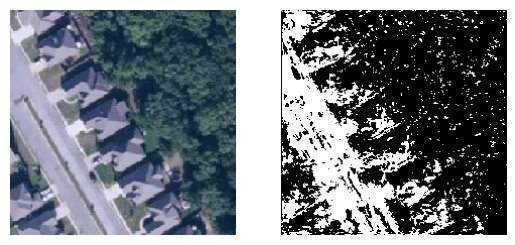

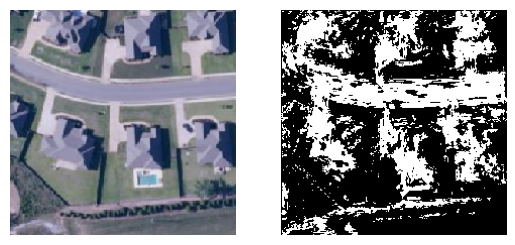

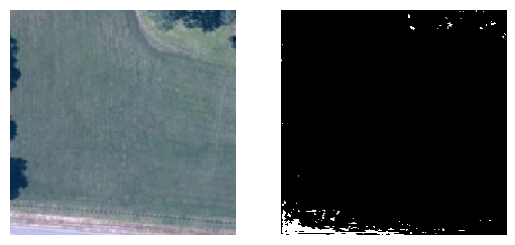

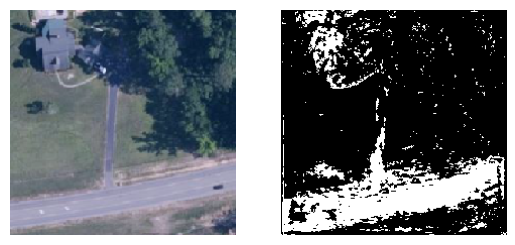

100%|██████████| 447/447 [08:12<00:00,  1.10s/it]


Epoch 2, Loss: 0.38515806611485665


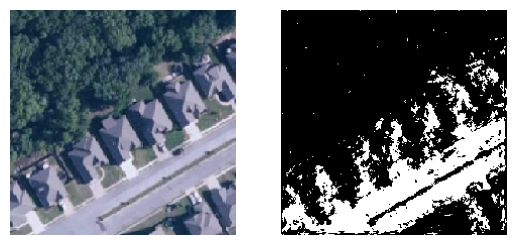

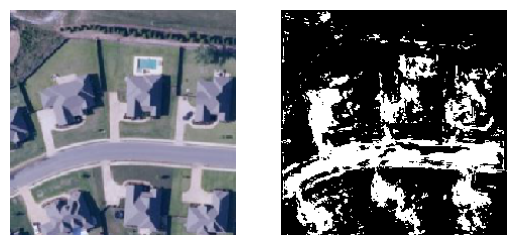

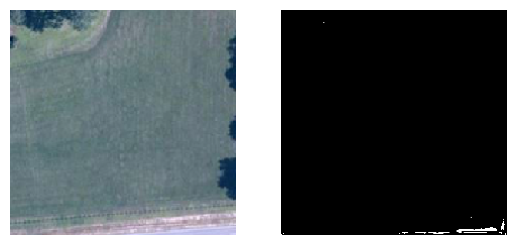

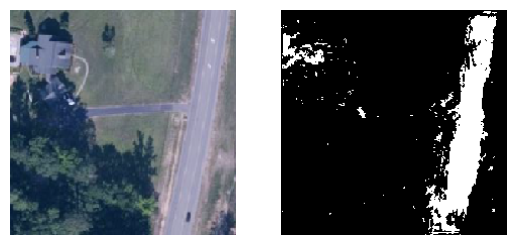

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 3, Loss: 0.33926347731477197


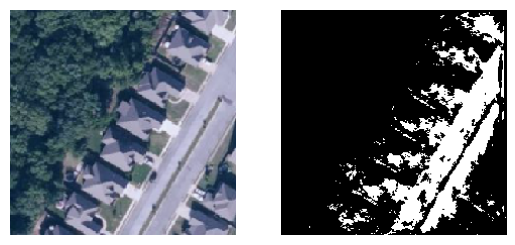

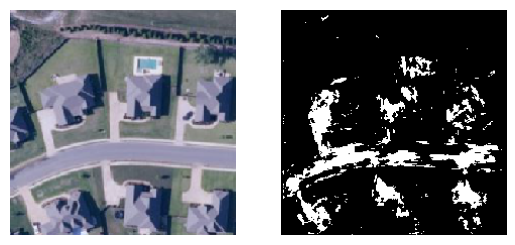

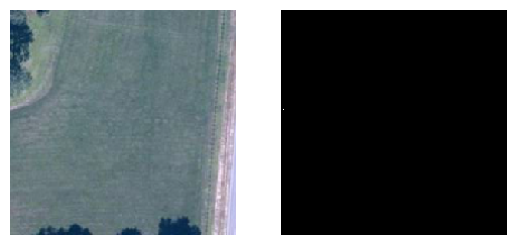

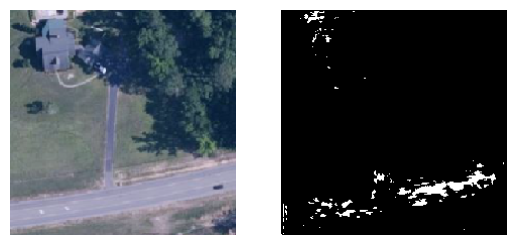

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 4, Loss: 0.2968467288635988


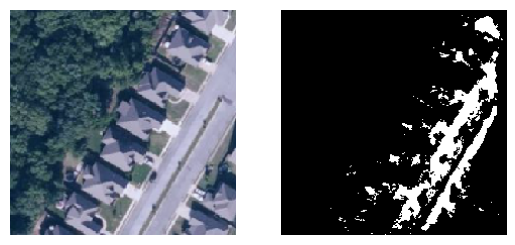

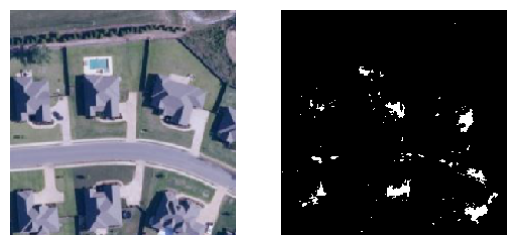

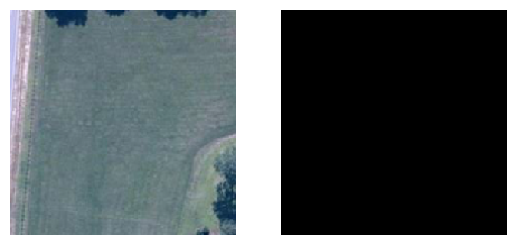

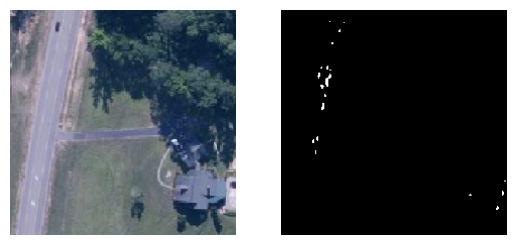

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 5, Loss: 0.2582575085445805


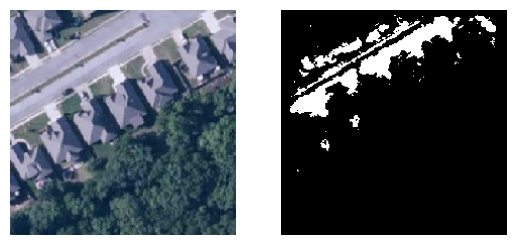

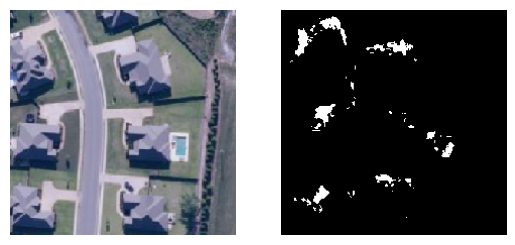

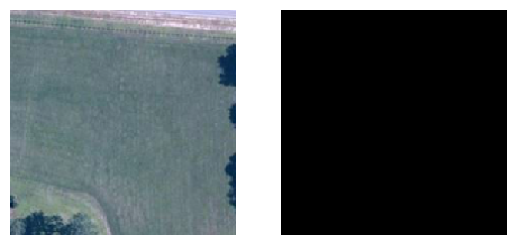

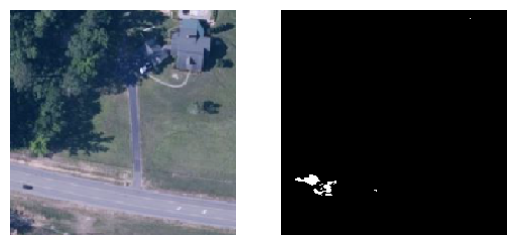

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 6, Loss: 0.2236591521525543


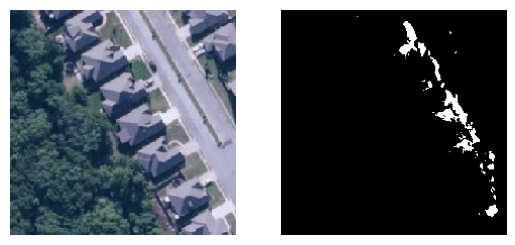

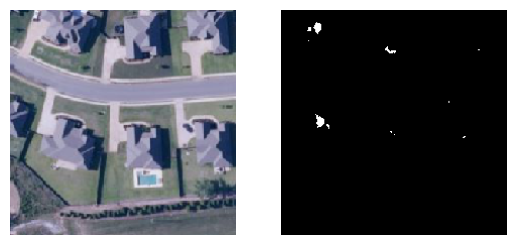

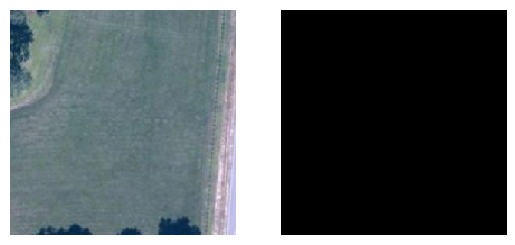

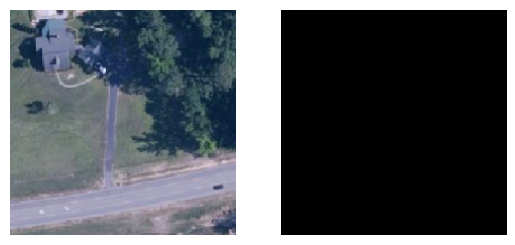

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 7, Loss: 0.19074075947405242


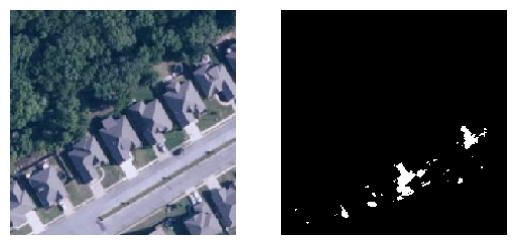

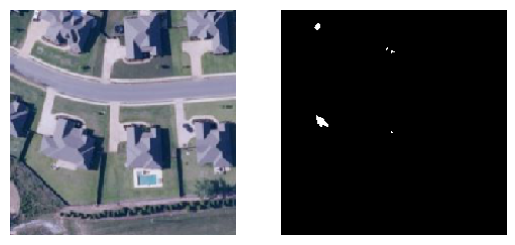

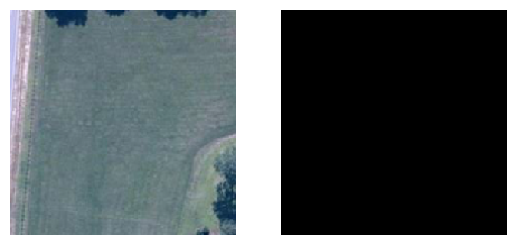

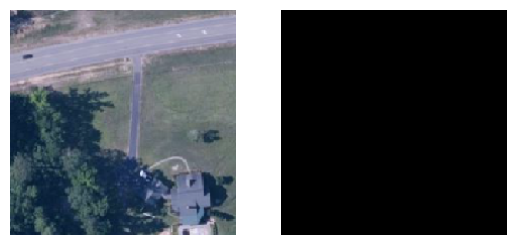

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 8, Loss: 0.15984664987397673


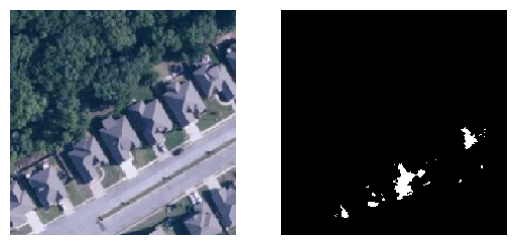

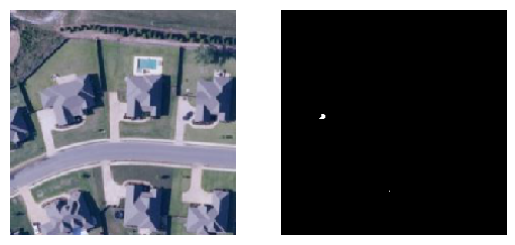

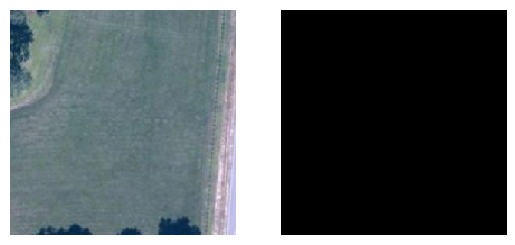

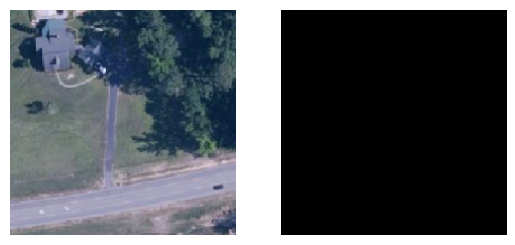

100%|██████████| 447/447 [08:14<00:00,  1.11s/it]


Epoch 9, Loss: 0.1345737751164959


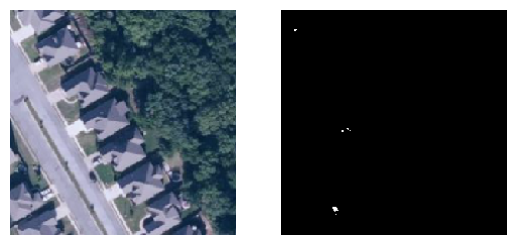

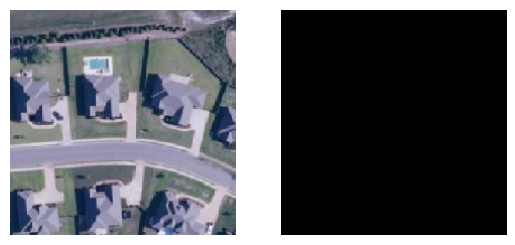

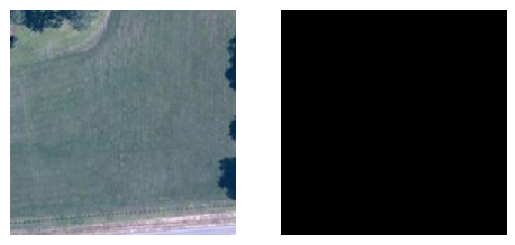

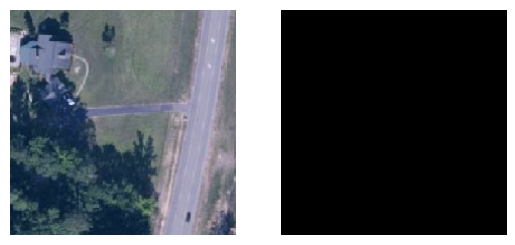

 16%|█▌        | 72/447 [01:21<07:03,  1.13s/it]


OverflowError: ignored

In [ ]:
for _ in range(10):
    model.train()
    epoch_loss = 0
    for images, masks in tqdm(dataloader):
        images = images.float().to(device)
        masks = masks.unsqueeze(1)
        masks = torch.cat([1 - masks, masks], dim=1)
        masks = masks.float().to(device)

        optimizer.zero_grad()
        outputs = model(images)

        loss = criterion(outputs, masks.unsqueeze(1))
        loss.backward()
        optimizer.step()
        scheduler.step()

        epoch_loss += loss.item()

    epoch += 1
    print(f'Epoch {epoch}, Loss: {epoch_loss/len(dataloader)}')
    with torch.no_grad():
        model.eval()
        for i in test_idx:
            image = test_dataset[i]
            input_image = image.to(device)
            mask = model(input_image.float().to(device).unsqueeze(0))[0]
            mask = torch.sigmoid(mask).cpu().numpy()
            mask = np.argmax(mask, axis=0)
            plt.figure()
            plt.subplot(1, 2, 1)
            image = (image - image.min()) / (image.max() - image.min())
            plt.imshow(image.permute(1, 2, 0))
            plt.axis('off')
            plt.subplot(1, 2, 2)
            plt.imshow(mask, cmap='gray')
            plt.axis('off')
            plt.show()

torch.save(model, f'./model_{version}_{epoch}.pth')
files.download(f'./model_{version}_{epoch}.pth')

### Inference

  0%|          | 0/3790 [00:00<?, ?it/s]

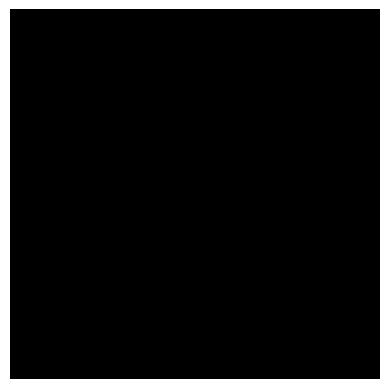

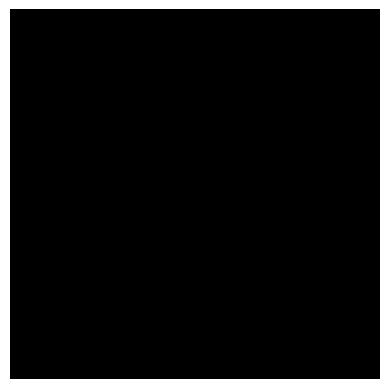

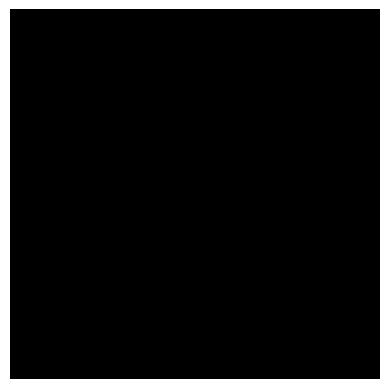

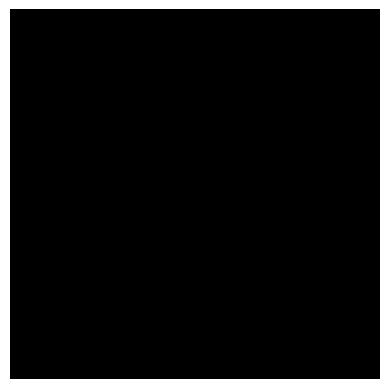

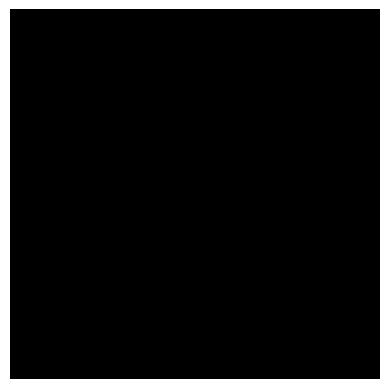

...

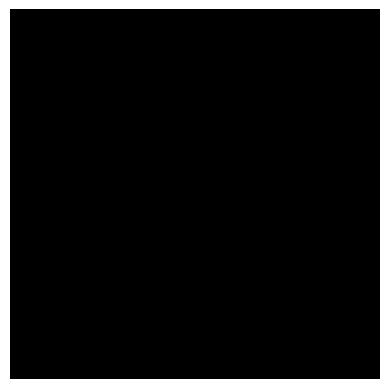

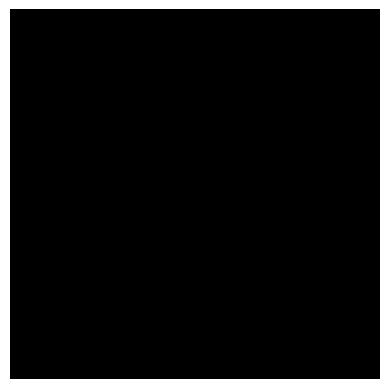

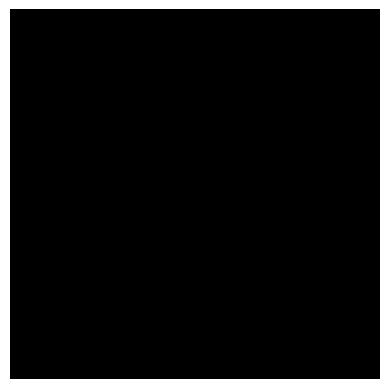

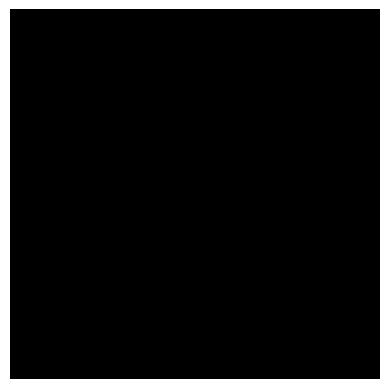

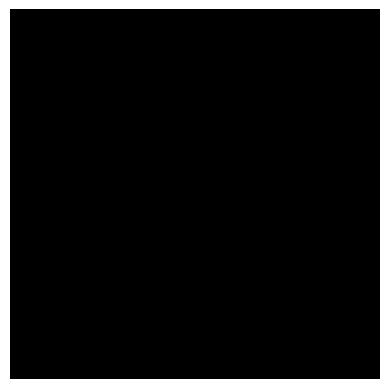

  0%|          | 1/3790 [00:02<2:40:49,  2.55s/it]

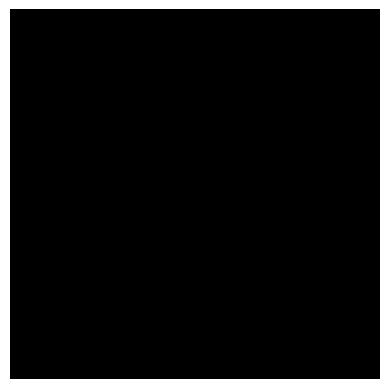

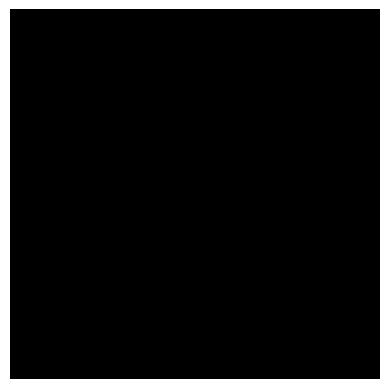

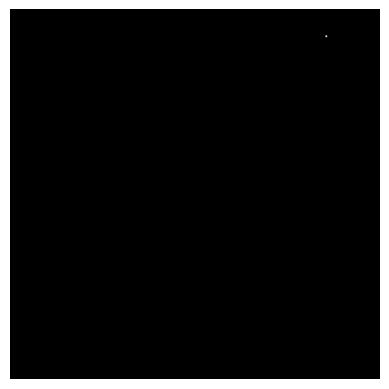

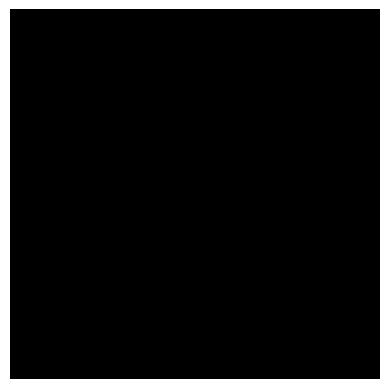

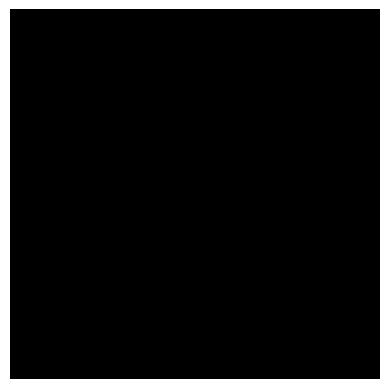

...

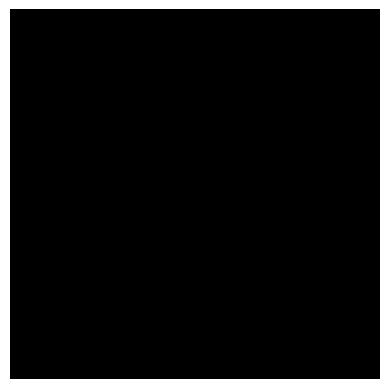

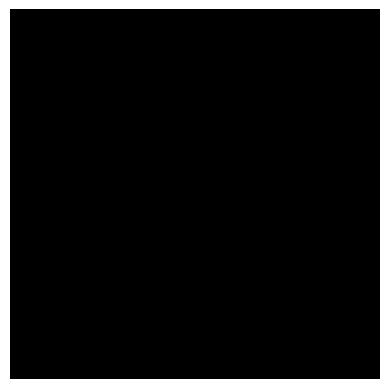

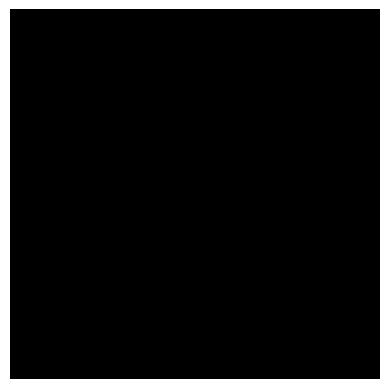

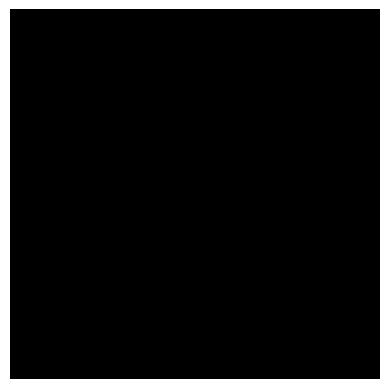

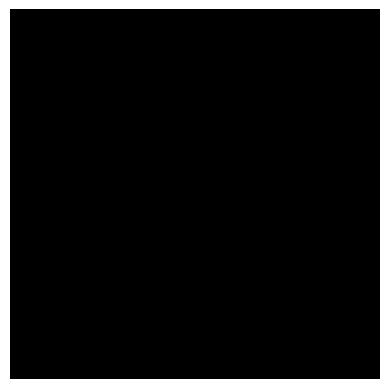

  0%|          | 2/3790 [00:05<2:43:34,  2.59s/it]

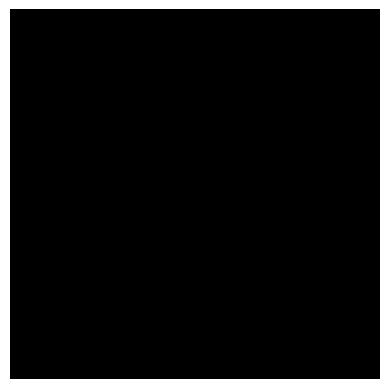

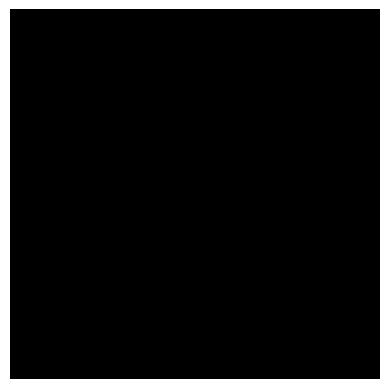

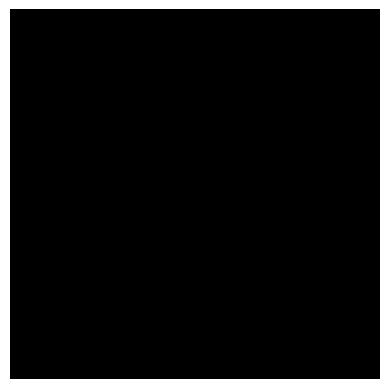

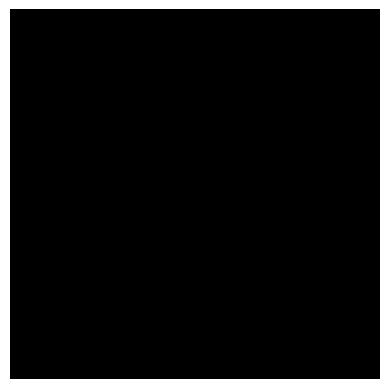

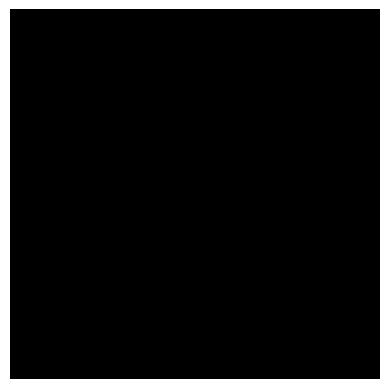

...

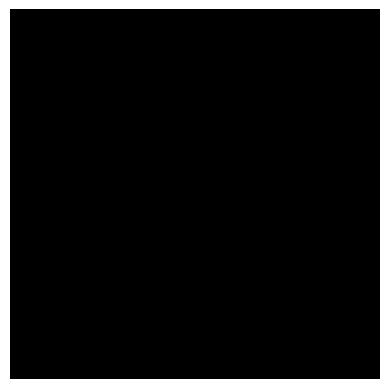

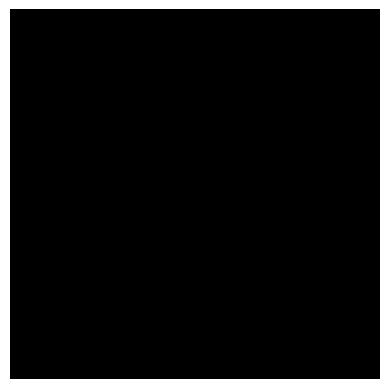

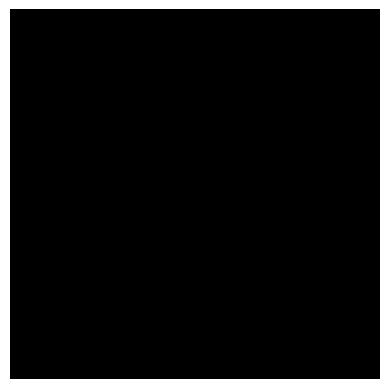

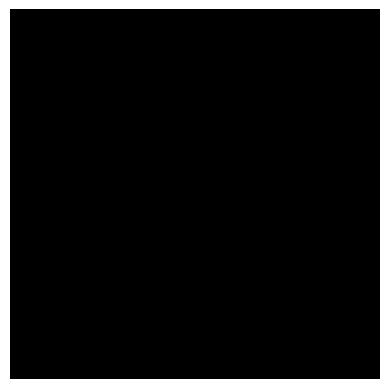

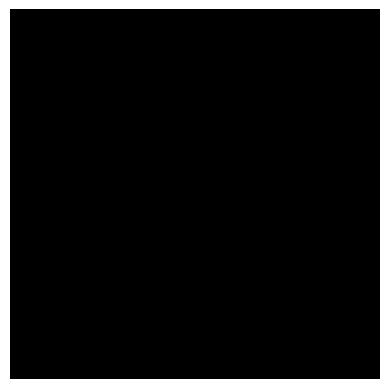

  0%|          | 3/3790 [00:06<2:20:25,  2.22s/it]

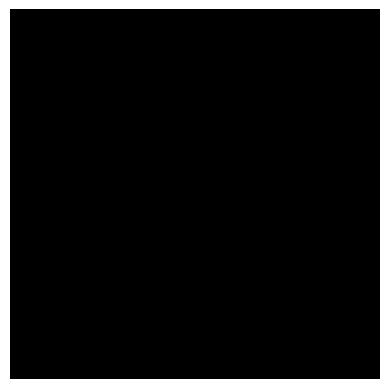

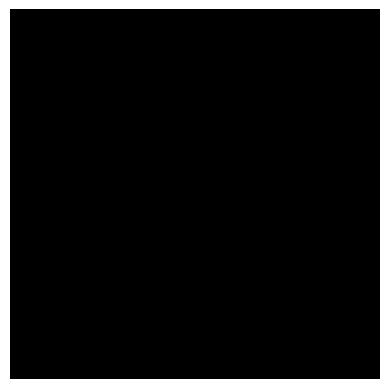

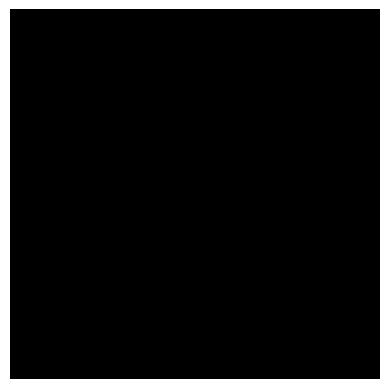

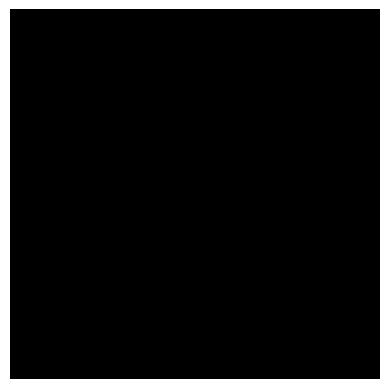

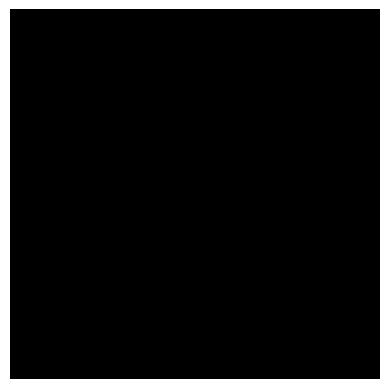

...

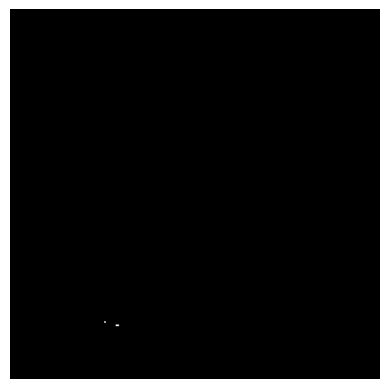

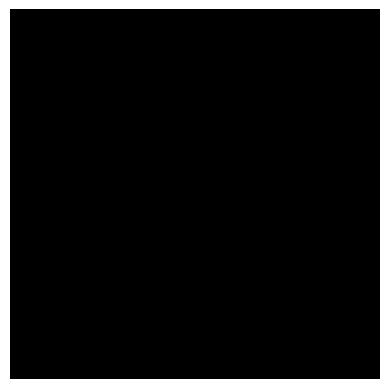

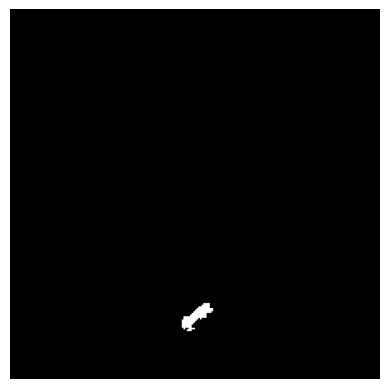

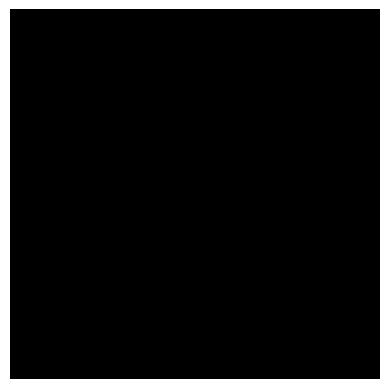

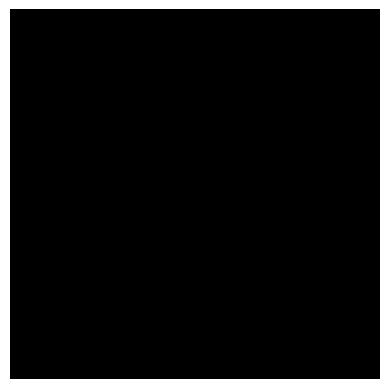

  0%|          | 4/3790 [00:08<2:05:58,  2.00s/it]

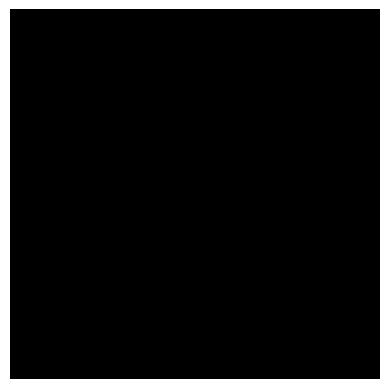

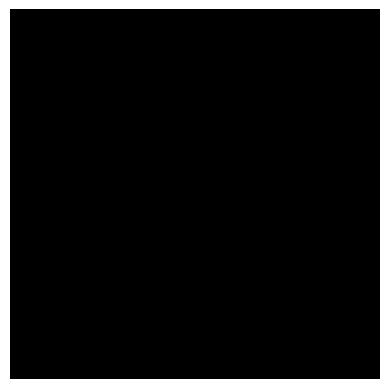

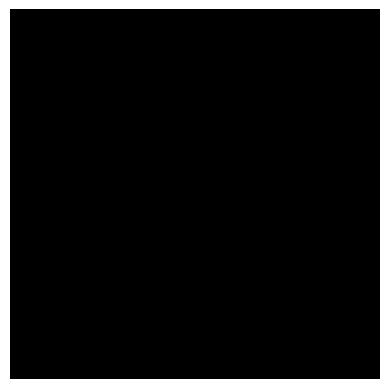

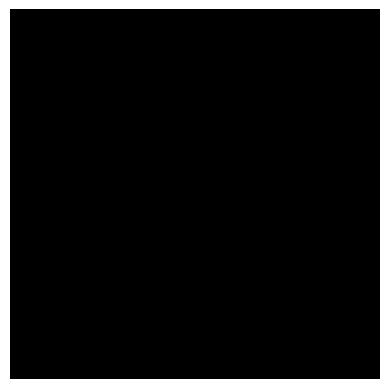

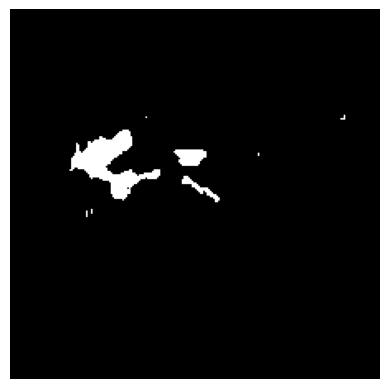

...

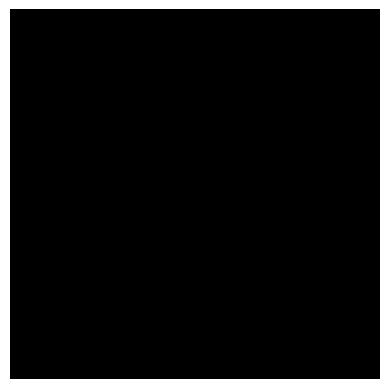

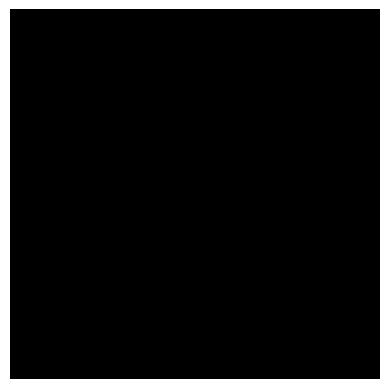

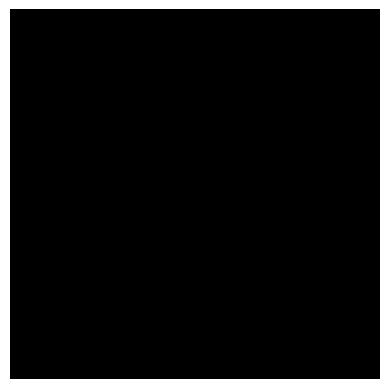

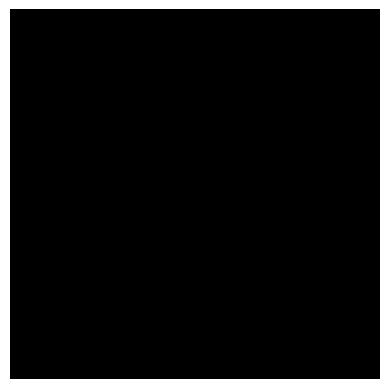

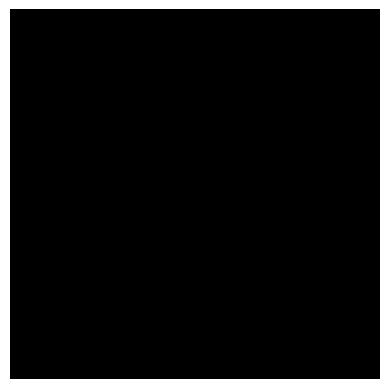

  0%|          | 5/3790 [00:10<1:59:40,  1.90s/it]

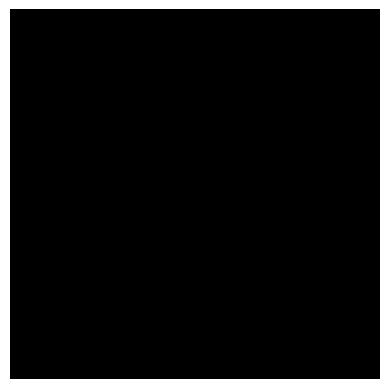

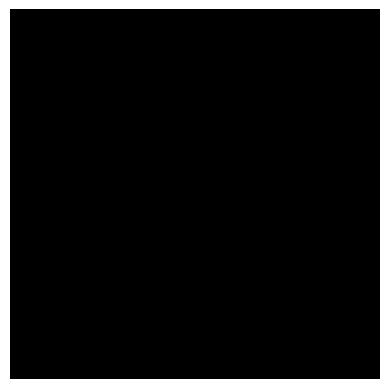

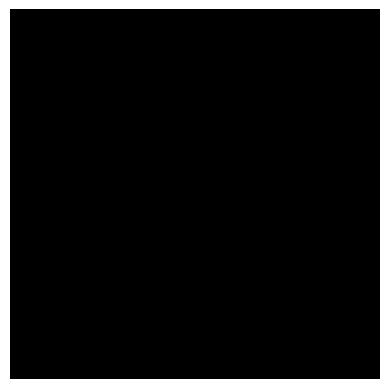

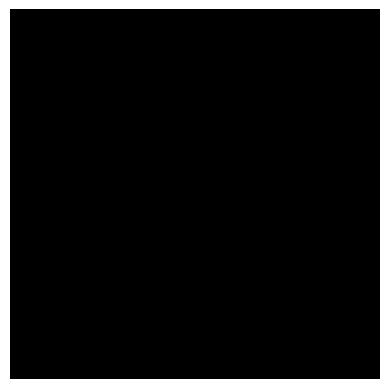

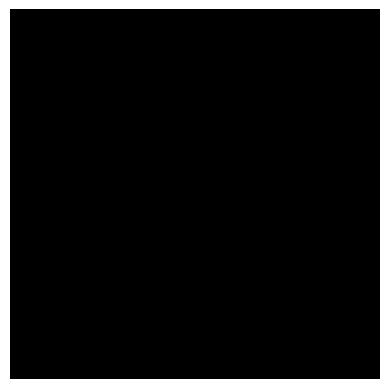

...

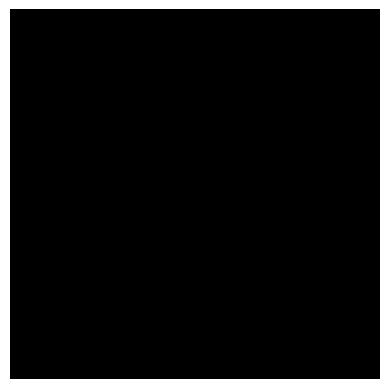

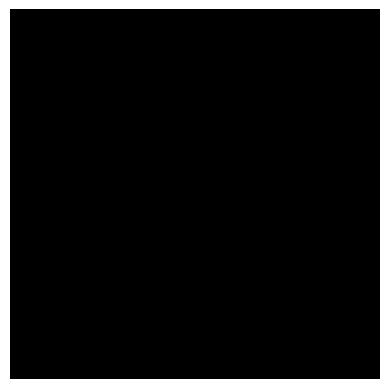

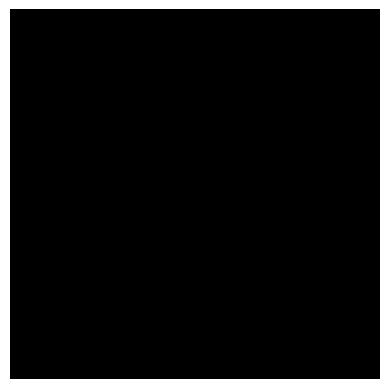

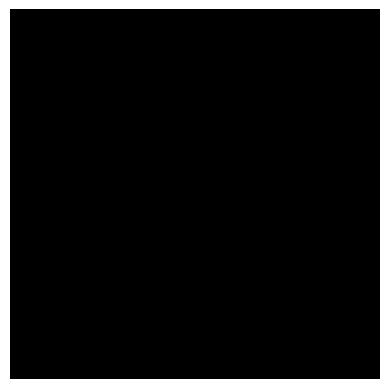

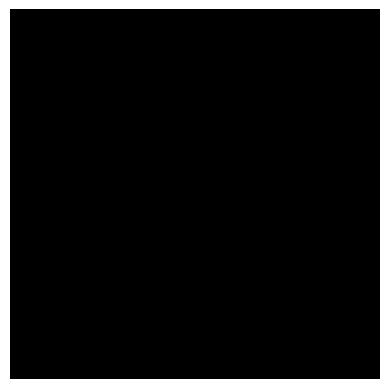

  0%|          | 6/3790 [00:12<1:55:25,  1.83s/it]

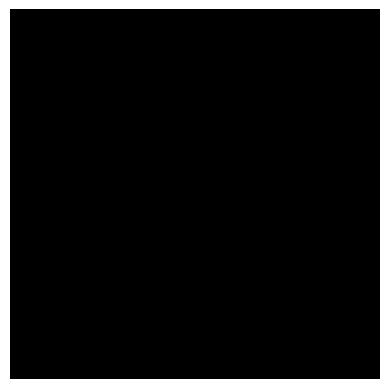

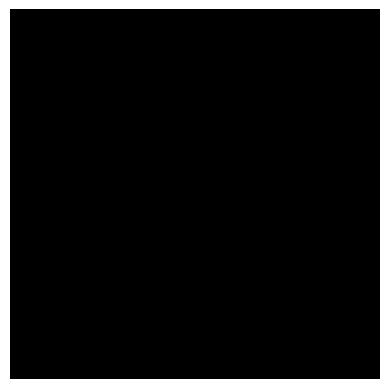

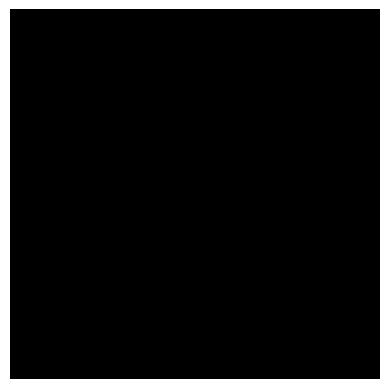

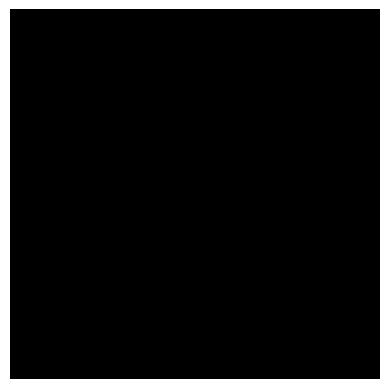

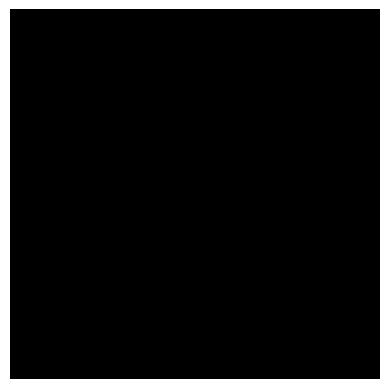

...

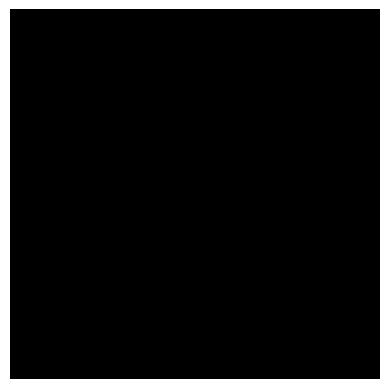

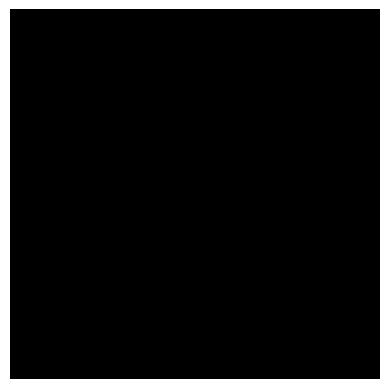

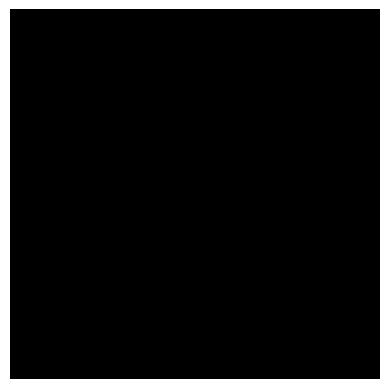

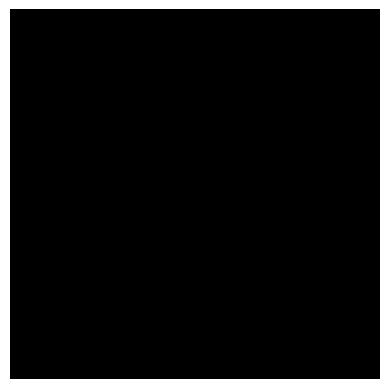

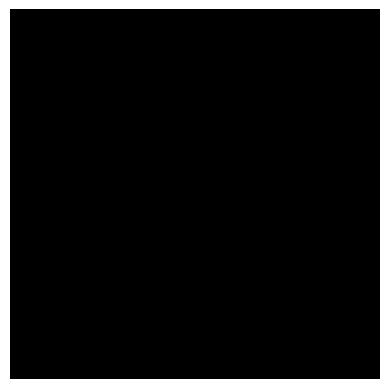

  0%|          | 7/3790 [00:13<1:51:56,  1.78s/it]

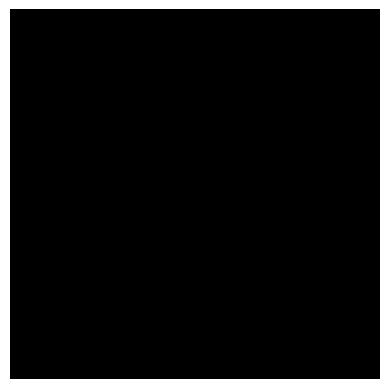

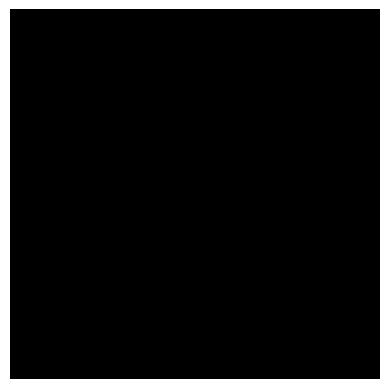

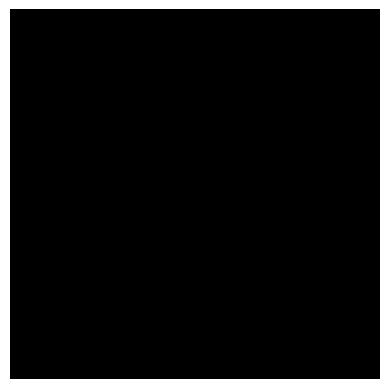

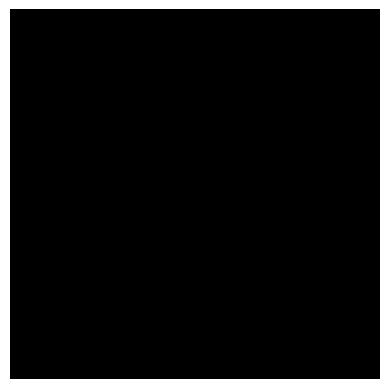

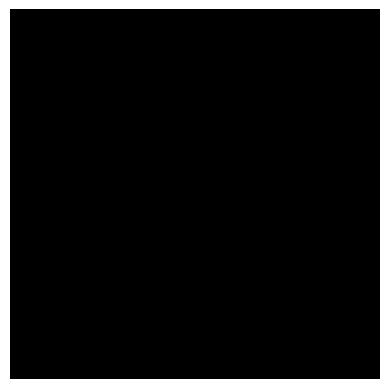

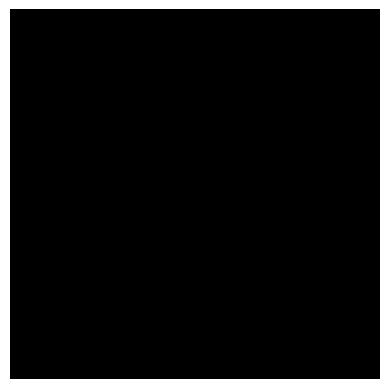

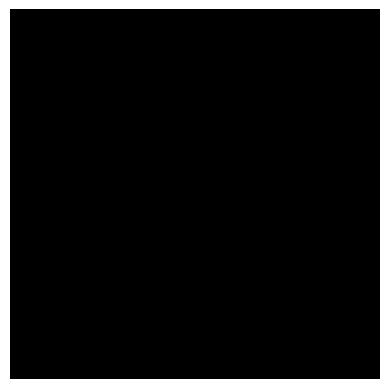

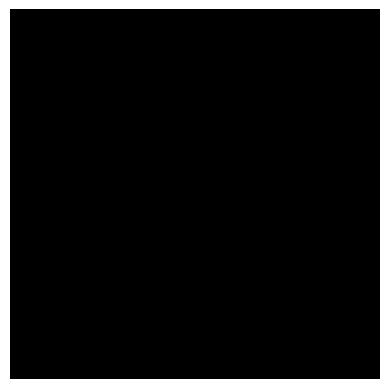

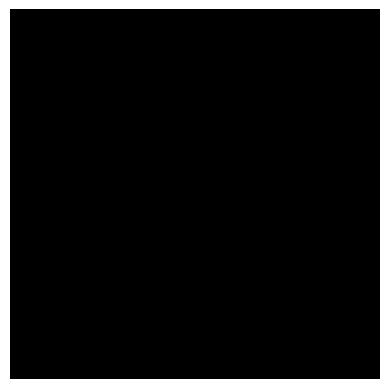

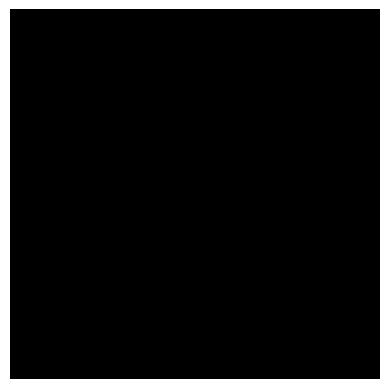

In [ ]:
transform = A.Compose(
    [
        A.Normalize(),
        ToTensorV2()
    ]
)

test_dataset = SatelliteDataset(csv_file='./test.csv', transform=transform, infer=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

with torch.no_grad():
    model.eval()
    result = []
    for images in tqdm(test_dataloader):
        images = images.float().to(device)

        outputs = model(images)
        masks = torch.sigmoid(outputs).cpu().numpy()
        masks = np.argmax(masks, axis=1)

        for mask in masks:
            plt.figure()
            plt.imshow(mask, cmap='gray')
            plt.axis('off')
            plt.show()

        for i in range(len(images)):
            mask_rle = rle_encode(masks[i])
            if mask_rle == '': # 예측된 건물 픽셀이 아예 없는 경우 -1
                result.append(-1)
            else:
                result.append(mask_rle)

### Submission

In [ ]:
submit = pd.read_csv('./sample_submission.csv')
submit['mask_rle'] = result

submit.to_csv(f'./submit_{version}_{epoch}.csv', index=False)
files.download(f'./submit_{version}_{epoch}.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Test Model

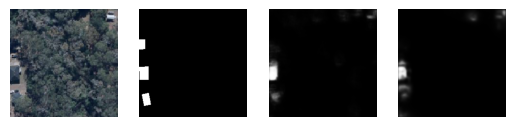

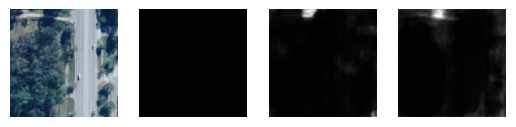

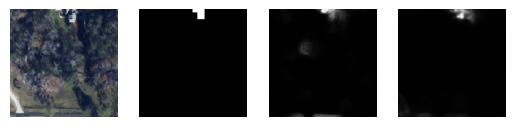

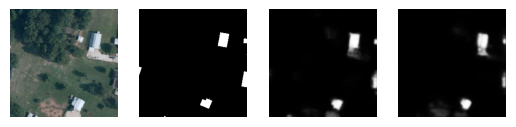

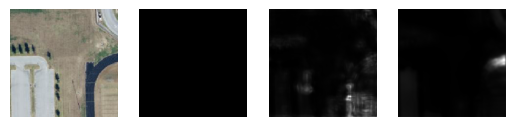

...

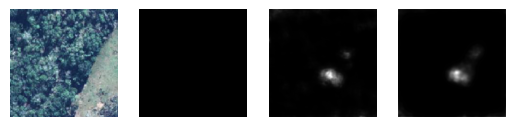

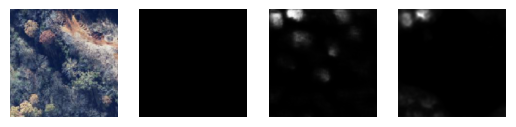

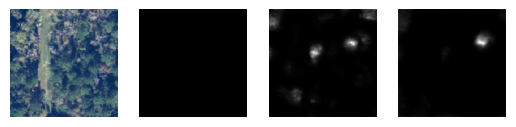

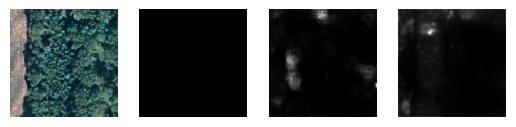

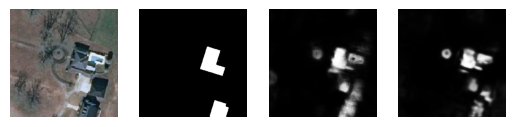

KeyboardInterrupt: ignored

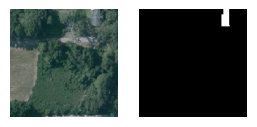

In [ ]:
transform = A.Compose(
    [
        A.RandomCrop(224, 224),
        A.HorizontalFlip(),
        A.VerticalFlip(),
        A.Normalize(),
        ToTensorV2()
    ]
)

dataset = SatelliteDataset(csv_file='./train.csv', transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=2)

test_dataset = SatelliteDataset(csv_file='./test.csv', transform=transform, infer=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2)

model1 = torch.load(f'./model_1_20.pth')
model2 = torch.load(f'./model_3_10.pth')

with torch.no_grad():
    model1.eval()
    model2.eval()
    for images, grounds in dataloader:
        input_images = images.float().to(device)
        outputs1 = model1(input_images)
        outputs2 = model2(input_images)

        for image, ground, mask1, mask2 in zip(images, grounds, outputs1, outputs2):
            mask1 = torch.sigmoid(mask1).cpu().numpy()
            mask1 = np.squeeze(mask1, axis=0)
            mask2 = torch.sigmoid(mask2).cpu().numpy()
            mask2 = np.squeeze(mask2, axis=0)

            plt.figure()
            plt.subplot(1, 4, 1)
            image = (image - image.min()) / (image.max() - image.min())
            plt.imshow(image.permute(1, 2, 0))
            plt.axis('off')
            plt.subplot(1, 4, 2)
            plt.imshow(ground, cmap='gray')
            plt.axis('off')
            plt.subplot(1, 4, 3)
            plt.imshow(mask1, cmap='gray')
            plt.axis('off')
            plt.subplot(1, 4, 4)
            plt.imshow(mask2, cmap='gray')
            plt.axis('off')
            plt.show()